### Perform Sentiment Analysis on youtube commnets

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb

In [2]:
comments = pd.read_csv('GBcomments.csv',error_bad_lines = False)

b'Skipping line 113225: expected 4 fields, saw 5\n'
b'Skipping line 158379: expected 4 fields, saw 7\nSkipping line 241590: expected 4 fields, saw 5\nSkipping line 245637: expected 4 fields, saw 7\n'
b'Skipping line 521402: expected 4 fields, saw 5\n'


In [3]:
comments.head()

,video_id,comment_text,likes,replies
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0


In [4]:
#pip install textblob

In [5]:
from textblob import TextBlob 

In [6]:
TextBlob("It's more accurate to call it the M+ (1000) be...").sentiment.polarity

0.45000000000000007

In [7]:
comments.isna().sum()


video_id         0
comment_text    28
likes            0
replies          0
dtype: int64

In [8]:
comments.dropna(inplace =True)

In [9]:
pol =[]
for i in comments['comment_text']:
    pol.append(TextBlob(i).sentiment.polarity)

In [10]:
print (comments['comment_text'][1])

To be there with a samsung phone\n😂😂😂


In [11]:
comments['polarity']= pol

In [12]:
comments.head(10)

,video_id,comment_text,likes,replies,polarity
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0,0.450000
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0,0.000000
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0,0.000000
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0,0.000000
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,1.000000
5,jt2OHQh0HoQ,Keep calm and buy iphone 8 Keep calm and buy i...,0,0,0.300000
6,jt2OHQh0HoQ,i am a big fan of youtube and u !!!!!!!!!!!!!,0,0,0.000000
7,jt2OHQh0HoQ,You will never find Losers who line up and pay...,0,0,-0.100000
8,jt2OHQh0HoQ,*APPLE JUST COMMENTED ON MY LAST VIDEO* I'm cr...,0,0,0.028571
9,jt2OHQh0HoQ,"I'm only here to see Emma, I love her so much!...",0,0,0.500000


### Exploratory Data Analysis (EDA ) omn positive comments


In [13]:
comments_positive = comments[comments['polarity']==1]

In [14]:
comments_positive.shape

(20400, 5)

In [15]:
#!pip install wordcloud

In [16]:
from wordcloud import WordCloud,STOPWORDS

In [17]:
total_comments = ' '.join(comments_positive['comment_text'] )

In [18]:
word_cloud =WordCloud(width =1000, height =500,stopwords = set(STOPWORDS)).generate(total_comments)

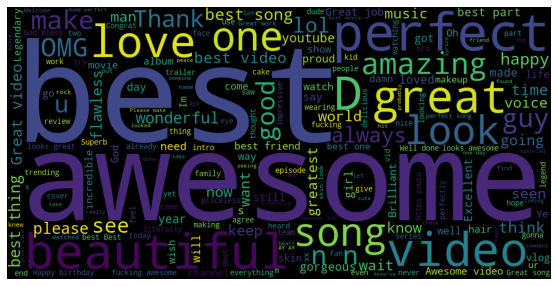

In [19]:
# plot the WordCloud image                       
plt.figure(figsize = (15, 5), facecolor = None)
plt.imshow(word_cloud)
plt.axis("off") 
plt.show()

### Exploratory Data Analysis (EDA ) on negative comments

In [20]:
comments_negative = comments[comments['polarity']==-1]

In [21]:
comments_negative.head()

,video_id,comment_text,likes,replies,polarity
1387,ql0Op1VcELw,boring,0,0,-1.0
1394,ql0Op1VcELw,0:22 **laughs at terrible pun**,1,1,-1.0
1530,-Ifnaxi2LQg,this is the worst thing i've heard. ever.,0,0,-1.0
1745,F2uJvwiSZAQ,People making jokes about 9/11 is truly disgus...,1,0,-1.0
1793,F2uJvwiSZAQ,Thats insane.,0,0,-1.0


In [22]:
total_comments_neg = " ".join(comments_negative['comment_text'])

In [23]:
word_cloud_2 = WordCloud(width = 1000,height = 500,stopwords = set(STOPWORDS)).generate(total_comments_neg)

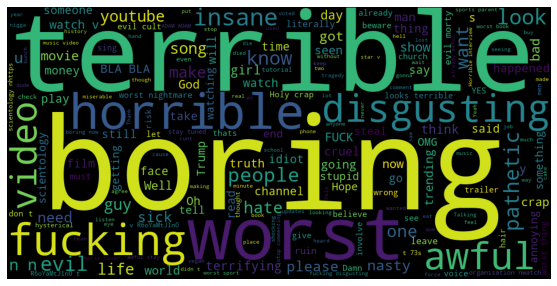

In [24]:
# plot the WordCloud image                       
plt.figure(figsize = (15, 5), facecolor = None)
plt.imshow(word_cloud_2)
plt.axis("off")  
plt.show()

### Analysising tags! What are the most treanding tags on Youtube 

In [25]:
videos = pd.read_csv('GBvideos.csv',error_bad_lines= False)

b'Skipping line 2398: expected 11 fields, saw 21\nSkipping line 2797: expected 11 fields, saw 21\n'


In [26]:
videos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,thumbnail_link,date
0,jt2OHQh0HoQ,Live Apple Event - Apple September Event 2017 ...,Apple Event,28,apple events|apple event|iphone 8|iphone x|iph...,7426393,78240,13548,705,https://i.ytimg.com/vi/jt2OHQh0HoQ/default_liv...,13.09
1,AqokkXoa7uE,Holly and Phillip Meet Samantha the Sex Robot ...,This Morning,24,this morning|interview|holly willoughby|philli...,494203,2651,1309,0,https://i.ytimg.com/vi/AqokkXoa7uE/default.jpg,13.09
2,YPVcg45W0z4,My DNA Test Results! I'm WHAT?!,emmablackery,24,emmablackery|emma blackery|emma|blackery|briti...,142819,13119,151,1141,https://i.ytimg.com/vi/YPVcg45W0z4/default.jpg,13.09
3,T_PuZBdT2iM,getting into a conversation in a language you ...,ProZD,1,skit|korean|language|conversation|esl|japanese...,1580028,65729,1529,3598,https://i.ytimg.com/vi/T_PuZBdT2iM/default.jpg,13.09
4,NsjsmgmbCfc,Baby Name Challenge!,Sprinkleofglitter,26,sprinkleofglitter|sprinkle of glitter|baby gli...,40592,5019,57,490,https://i.ytimg.com/vi/NsjsmgmbCfc/default.jpg,13.09


In [27]:
tags_complete = " ".join(videos['tags'])

In [28]:
tags_complete

"apple events|apple event|iphone 8|iphone x|iphone 8 plus|iphone 7s|iphone 7s plus|ios 11 this morning|interview|holly willoughby|phillip schofield|ruth langsford|eamonn holmes|chat shows - topic|chat show - topic|talk shows - topic|sex robot|samantha|real life emmablackery|emma blackery|emma|blackery|british vlogger|british youtuber|female vlogger|birdyboots|dna test|23andme|ancestry skit|korean|language|conversation|esl|japanese|foreign|communication|don't speak|struggle|foreigner|lotte mart|korea|south|weather|good|tutorial sprinkleofglitter|sprinkle of glitter|baby glitter|Louise Pentland|Louise Pentland Baby Name|Mrs Meldrum|Baby Names|Nice baby names|Unusual baby names Rio Ferdinand|Rio|Ferdinand|5 Magazine|5 Mag|#5|5 Rio Ferdinand|Rio Ferdinand interview|football|soccer|interview|Manchester United|Man United|fifa 18|fut 18|fut|fifa ratings|fifa 18 ratings|chelsea|chelsea fc|chelsea f.c|David Luiz|Eden Hazard|Christensen|Premier League|Champions League|Fifa18|Hazard Fifa 18|David

In [29]:
import re

In [30]:
tags = re.sub('[^a-zA-Z]', ' ',tags_complete)

In [31]:
tags


'apple events apple event iphone   iphone x iphone   plus iphone  s iphone  s plus ios    this morning interview holly willoughby phillip schofield ruth langsford eamonn holmes chat shows   topic chat show   topic talk shows   topic sex robot samantha real life emmablackery emma blackery emma blackery british vlogger british youtuber female vlogger birdyboots dna test   andme ancestry skit korean language conversation esl japanese foreign communication don t speak struggle foreigner lotte mart korea south weather good tutorial sprinkleofglitter sprinkle of glitter baby glitter Louise Pentland Louise Pentland Baby Name Mrs Meldrum Baby Names Nice baby names Unusual baby names Rio Ferdinand Rio Ferdinand   Magazine   Mag      Rio Ferdinand Rio Ferdinand interview football soccer interview Manchester United Man United fifa    fut    fut fifa ratings fifa    ratings chelsea chelsea fc chelsea f c David Luiz Eden Hazard Christensen Premier League Champions League Fifa   Hazard Fifa    David

In [32]:
tags = re.sub(' +',' ',tags)

In [33]:
tags

'apple events apple event iphone iphone x iphone plus iphone s iphone s plus ios this morning interview holly willoughby phillip schofield ruth langsford eamonn holmes chat shows topic chat show topic talk shows topic sex robot samantha real life emmablackery emma blackery emma blackery british vlogger british youtuber female vlogger birdyboots dna test andme ancestry skit korean language conversation esl japanese foreign communication don t speak struggle foreigner lotte mart korea south weather good tutorial sprinkleofglitter sprinkle of glitter baby glitter Louise Pentland Louise Pentland Baby Name Mrs Meldrum Baby Names Nice baby names Unusual baby names Rio Ferdinand Rio Ferdinand Magazine Mag Rio Ferdinand Rio Ferdinand interview football soccer interview Manchester United Man United fifa fut fut fifa ratings fifa ratings chelsea chelsea fc chelsea f c David Luiz Eden Hazard Christensen Premier League Champions League Fifa Hazard Fifa David Luiz Fifa Christensen Fifa Chelsea Fifa

In [34]:
word_cloud_3 = WordCloud(width = 1000, height = 500 ,stopwords = set(STOPWORDS)).generate(tags)  

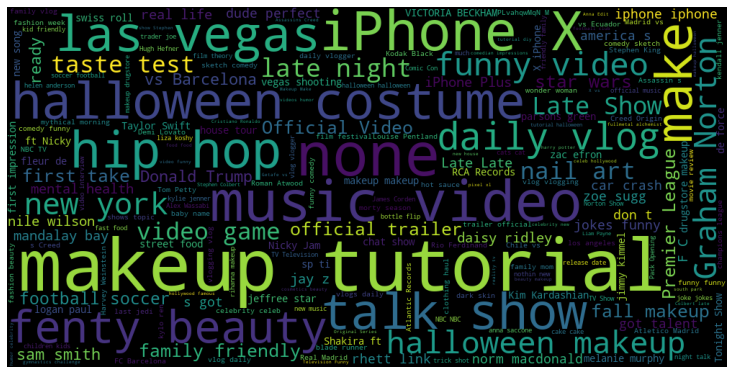

In [35]:
# plot the WordCloud image                       
plt.figure(figsize = (15, 5), facecolor = None)
plt.imshow(word_cloud_3)
plt.axis("off")
plt.tight_layout(pad = 0)
  
plt.show()

#### Perform Ananlysis on Likes, Dislikes, Comments and how they are correlated with each other

Text(0.5, 1.0, 'Regressin plot of Views and likes')

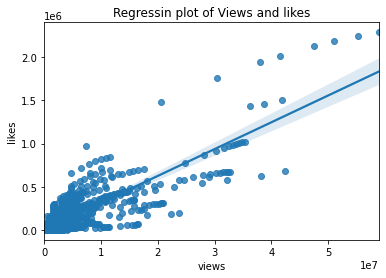

In [36]:
sb.regplot(x=videos['views'],
    y=videos['likes'],
    data=videos,)
plt.title('Regressin plot of Views and likes')

Text(0.5, 1.0, 'Regressin plot of Views and Dislikes')

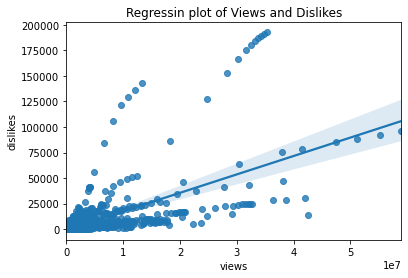

In [37]:
sb.regplot(x=videos['views'],
    y=videos['dislikes'],
    data=videos,)
plt.title('Regressin plot of Views and Dislikes')

In [38]:
df_corr = videos[['likes','views','dislikes']]

In [39]:
df_corr.corr()

,likes,views,dislikes
likes,1.000000,0.866249,0.623797
views,0.866249,1.000000,0.671703
dislikes,0.623797,0.671703,1.000000


<AxesSubplot:>

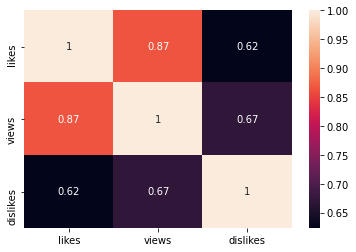

In [40]:
sb.heatmap(df_corr.corr(),annot = True)

#### Performing emoji Ananlysis

In [41]:
comments.head()

,video_id,comment_text,likes,replies,polarity
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0,0.45
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0,0.00
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0,0.00
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0,0.00
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,1.00


In [42]:
comments['comment_text'][1]

'To be there with a samsung phone\\n😂😂😂'

In [43]:
#!pip install emoji

In [44]:
import emoji

In [45]:
comment = comments['comment_text'][1]
comment

'To be there with a samsung phone\\n😂😂😂'

In [46]:
emoji.UNICODE_EMOJI_ENGLISH

{'🥇': ':1st_place_medal:',
 '🥈': ':2nd_place_medal:',
 '🥉': ':3rd_place_medal:',
 '🆎': ':AB_button_(blood_type):',
 '🏧': ':ATM_sign:',
 '🅰': ':A_button_(blood_type):',
 '🇦🇫': ':Afghanistan:',
 '🇦🇱': ':Albania:',
 '🇩🇿': ':Algeria:',
 '🇦🇸': ':American_Samoa:',
 '🇦🇩': ':Andorra:',
 '🇦🇴': ':Angola:',
 '🇦🇮': ':Anguilla:',
 '🇦🇶': ':Antarctica:',
 '🇦🇬': ':Antigua_&_Barbuda:',
 '♒': ':Aquarius:',
 '🇦🇷': ':Argentina:',
 '♈': ':Aries:',
 '🇦🇲': ':Armenia:',
 '🇦🇼': ':Aruba:',
 '🇦🇨': ':Ascension_Island:',
 '🇦🇺': ':Australia:',
 '🇦🇹': ':Austria:',
 '🇦🇿': ':Azerbaijan:',
 '🔙': ':BACK_arrow:',
 '🅱': ':B_button_(blood_type):',
 '🇧🇸': ':Bahamas:',
 '🇧🇭': ':Bahrain:',
 '🇧🇩': ':Bangladesh:',
 '🇧🇧': ':Barbados:',
 '🇧🇾': ':Belarus:',
 '🇧🇪': ':Belgium:',
 '🇧🇿': ':Belize:',
 '🇧🇯': ':Benin:',
 '🇧🇲': ':Bermuda:',
 '🇧🇹': ':Bhutan:',
 '🇧🇴': ':Bolivia:',
 '🇧🇦': ':Bosnia_&_Herzegovina:',
 '🇧🇼': ':Botswana:',
 '🇧🇻': ':Bouvet_Island:',
 '🇧🇷': ':Brazil:',
 '🇮🇴': ':British_Indian_Ocean_Territory:',
 '🇻🇬': ':British_Vir

In [47]:
[ c for c in comment if c in emoji.UNICODE_EMOJI_ENGLISH]

['😂', '😂', '😂']

In [48]:
str= ' '
for i in comments['comment_text'] :
    lst = [c for c in i if c in emoji.UNICODE_EMOJI_ENGLISH]
    for ele in lst:
        str = str + ele

In [49]:
str

' 😂😂😂😭😭😭😢😢😢❤❤😂👏👇👇👇👇👇👇👇👇👇👇🌞😎😣😥😫😭✌😂👎🏻👎🏻👎🏻👎🏻😂🖕😘😘▶⏭⏮◀🔥🔥😊😊🤔🤔😂😂😂😂👏🏻👏🏻❤❤😜😍😍😅❤😍😍✌😂😂😂😊😂😂😂😂😏😏😭💔😊❤❤❤❤❤😂😂😊❤😂🤣✨🌈😘😂😂❤😊😂😊😂💗😂😊😊😊💖🐢😉😍😂😂💗💗😻😻❤😂😂❤❤🤗👌🏼👌🏼😂😂😂😂💖😩🙊♥♥♥😂😂😂💙💙💙💙💙💙😂😂😂❤❤❤😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😱😊😛🌳🌽🎃🚣🚂😂😂😊😕😋🤣😅😢💔😂😊🤡🙏🙏🙏👊🏿🙇🏽👋😅😅😅😅😂😂🤔😎😎😎😎😎😎😎😍😍😍😍😍😍😘😘😘😘😘😘😘😲🖕💪🤘💓☺☺😂😂😂💕😄😄😍💕😉😩❤❤💕❤😂💕😍💗👫💖😆💕💖💕😍😍😊😄😍😀💗🦄😍😊😂😊👍😍♥❤😂👶🏻🤗☺😘💙💙💙😍😍😊😎🤘🖤👌👌😍😂👌🍍😎😎😄😄😄😄😂😂😂😬💜💜💜😭😂😍😍💖😂😂😂😂😂😂😂😭😂😭😂😭😂😂😂😍😍😍😭😍😍😂👀👀🤔😂😂😂😂😂😂😂😂😂😂🍸🍸🍸🍸🍸😂😂😂🤣🤣🤣😂😂😂😂😍💜💜💜💜😂😂😂😅😂😍💖😂😻😉🔥❤😻❤😭😭😭😭😭😭😭👍🏻😍💚💙❤❤😫❤❤❤❤❤♥😍❤😊😍😎💄🐐😅😂😂😊😊👀👌🏽❤❤❤😂💖🎉💪💪🏽😎🙌🙌😜❤❤💛💛😎🙏💚🎉🎉❤🎉🎉🎉🎉🎊🎉🎊🎉😭💗😍😍😍😍😍😍😍👏✌😁❤❤😂💋💋👫💘😻💋💋😂👑🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥😂😐😑😩👌🏻🔥💖👏🏻👀✨👅💦💕❤😍🔥🔥🔥❤❤❤❤❤❤❤👌😍😍😍😞🌴💜💜💜💜😍😍😍😍😍❤❤❤❤❤😊❤❤❤❤🍔🍟😒🌿😄😄😄😉🍲🍱🎏❤💪👊🏽😘😂😂😂❤🙋☺😍😍😚💕😉😂❤❤😊☺💓🌸🙄🙄🙄🙁😞😊🙄😍😨😍😍😍😍😎😃😂😍😏😌😂😎🤑😂😉👍🏻🔥💯🚨😊☺😂😂😂🤣🙂❤❤😀😀😀♥♥😂❤😂😓😭😂❤❤😖😖😂😂😂💗💝😘💐💐💐😂😍☺😂❤😭💕🙌🏽🙌🏽🙌🏽😘😘❤❤💖😫😖📱😂😏🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗😁🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗😎😂😂👍🏼💯💕♥♥♥😱😱😱❤❤❤😍😍😩😩😩😩😩😩😩😍😻😻😻😻😻😳🥀♥♥♥♥♥♥😍😍😍🙃😂💕💕💕😍💕💕❤❤💕😍🍫🌹💖❤😍👸🏿👸🏿👸🏿👸🏿👸🏿💗😊😊😩❤👌🏼😻😊😍❤😂😂👏🏼❤❤❤❤❤😍😍😍💚💚💚💚💚😍😭🌹😍❤😍😍😍💚💚💚💚💚😍💚💚💚☺💙😀😍💚😕😍👌😂😂😂😍👌🏻💗❤💚💚💚😸😙😙😘💚💚💚💚😍😭😭💖💓💓💓😍❤😘😘🤗🤗🤗❤😀😀💓💓💓❤😂❤😍❤❤♥♥♥❤🙌❤😂❤❤😍❤💜😍😭😍😍😍😊💗💕😍❤💗💗💛💛💛💖💖😍😐😍😍😍😍🗿😂🤗😩😩😩💖💖💖❤❤❤❤❤😍😍✨😍👍🏻😁😂😍💅❤😘❤❤😈👀😄😈👍☝👆✊👌✌👊✋👋👏👐👉👈💔😂😂😬😭😥☺😂😂😂😂😍😍😍😜😂😂😂😂😂😒👎🏽😱😱😱😱😂😎😛🙊✊✌😑😑😑👌😊😊😍😊❤❤❤❤

In [50]:
result = {}
for i in set(str):
    result[i] = str.count(i)

In [51]:
result

{'🏂': 13,
 '💠': 11,
 '🐪': 13,
 '⌛': 12,
 '🏵': 28,
 '🤸': 79,
 '🔇': 7,
 '🛋': 5,
 '🎭': 29,
 '👪': 13,
 '🌄': 17,
 '🔅': 39,
 '🥖': 3,
 '🏐': 6,
 '🔊': 58,
 '👙': 66,
 '📩': 9,
 '🔍': 11,
 '😳': 545,
 '🈹': 5,
 '👿': 90,
 '✒': 20,
 '💽': 19,
 '🌐': 27,
 '😿': 127,
 '📽': 21,
 '⚗': 4,
 '🎪': 16,
 '🙋': 430,
 '😃': 1327,
 '🔈': 7,
 '📱': 226,
 '🏎': 7,
 '💂': 18,
 '🐾': 87,
 '🚵': 12,
 '🔴': 819,
 '🎶': 855,
 '🚽': 76,
 '🧒': 2,
 '💅': 166,
 '🕯': 9,
 '🏘': 8,
 '🐙': 43,
 '🏄': 15,
 '⚕': 16,
 '🚷': 11,
 '🎓': 18,
 '👝': 14,
 '🕝': 8,
 '🤪': 10,
 '🈲': 5,
 '🙃': 278,
 '🤫': 3,
 '➰': 7,
 '💙': 2968,
 '🎩': 29,
 '💵': 118,
 '🤢': 301,
 '🎥': 106,
 '🛡': 8,
 '🎰': 16,
 '🗯': 13,
 '🐿': 15,
 '🐀': 45,
 '🎞': 8,
 '🕓': 11,
 '🥞': 4,
 '🚝': 7,
 '👭': 75,
 '😒': 570,
 '💾': 13,
 '🍗': 630,
 '🌎': 127,
 '🎖': 38,
 '💦': 399,
 '💑': 132,
 '📒': 19,
 '💹': 4,
 '👥': 13,
 '📙': 11,
 '🎠': 24,
 '🚞': 7,
 '🙏': 1886,
 '🎅': 53,
 '🚡': 12,
 '🌦': 19,
 '🥑': 13,
 '🕍': 6,
 '🌯': 74,
 '🥃': 23,
 '🌟': 587,
 '🤦': 439,
 '🏋': 11,
 '🎣': 27,
 '🌙': 80,
 '♐': 12,
 '💈': 8,
 '🆗': 12,
 '➕': 78,


In [52]:
final ={}
for key, value in sorted(result.items(),key = lambda kv:kv[1]):
    final[key]= value

In [53]:
final

{'🤹': 1,
 '🛷': 1,
 '🥜': 1,
 '🥨': 1,
 '🥚': 1,
 '🧠': 1,
 '🛒': 1,
 '🦏': 1,
 '🥟': 1,
 '🧤': 1,
 ' ': 1,
 '🦓': 1,
 '🤟': 1,
 '🤽': 1,
 '🤾': 1,
 '🧣': 1,
 '🥡': 1,
 '🤺': 1,
 '🥌': 1,
 '🧒': 2,
 '🥅': 2,
 '🧢': 2,
 '🎌': 2,
 '🤱': 2,
 '🧛': 2,
 '🦔': 2,
 '🧘': 2,
 '🧡': 2,
 '🧝': 2,
 '🦖': 2,
 '🦕': 2,
 '🥖': 3,
 '🤫': 3,
 '🧐': 3,
 '🤨': 3,
 '🥄': 3,
 '🤯': 3,
 '⚗': 4,
 '🥞': 4,
 '💹': 4,
 '⏹': 4,
 '🗂': 4,
 '🗄': 4,
 '⏏': 4,
 '⏸': 4,
 '🦍': 4,
 '🏌': 4,
 '🥝': 4,
 '☸': 4,
 '🛢': 4,
 '🖍': 4,
 '🤵': 4,
 '☦': 4,
 '🦐': 4,
 '🛣': 4,
 '⏲': 4,
 '🥈': 4,
 '🖇': 4,
 '♾': 4,
 '⚧': 4,
 '🤬': 4,
 '⚙': 4,
 '🏷': 4,
 '🗓': 4,
 '⏯': 4,
 '♟': 4,
 '🧟': 4,
 '🦆': 4,
 '🛬': 4,
 '🛋': 5,
 '🈹': 5,
 '🈲': 5,
 '🏮': 5,
 '↔': 5,
 '🦒': 5,
 '🈂': 5,
 '🕹': 5,
 '⛱': 5,
 '↪': 5,
 '🔳': 5,
 '🈴': 5,
 '🔡': 5,
 '♠': 5,
 '🧜': 5,
 '⚒': 5,
 '🈁': 5,
 '↖': 5,
 '🛥': 5,
 '➿': 5,
 '🎐': 5,
 '🈳': 5,
 '🔄': 5,
 '✡': 5,
 '🖼': 5,
 '🚠': 5,
 '⛸': 5,
 '🚻': 5,
 '🚛': 5,
 '🔤': 5,
 '🔁': 5,
 '⛏': 5,
 'ℹ': 5,
 '🚁': 5,
 '🧖': 5,
 '🔢': 5,
 '🖊': 5,
 '🈯': 5,
 '🥉': 5,
 '🗜': 5,
 '↕': 5,
 '🗃': 5,
 

In [54]:
keys = [*final.keys()]
values= [*final.values()]
# * is unzip operator

In [55]:
df = pd.DataFrame({'chars':keys[-20:], 'Count': values[-20:]})

In [56]:
df

,chars,Count
0,🙌,2734
1,🏼,2961
2,💙,2968
3,💗,3071
4,👌,3534
5,💜,3616
6,🏻,4412
7,💖,4809
8,😊,4946
9,👏,5357


In [60]:
pip install plotly==5.1.0 

Note: you may need to restart the kernel to use updated packages.


In [61]:
from plotly.offline import iplot
import plotly.graph_objs as go

In [62]:
trace = go.Bar(x = df['chars'],
                y = df['Count'])
iplot([trace])